# Task 3: Variational Autoencoder (VAE)

This notebook implements and compares convolutional VAEs on MNIST to learn latent representations, reconstruct inputs, generate new samples, and study the effect of latent dimensionality.

## Objectives
- Building a convolutional VAE and training a model with latent dimension 128
- Training and evaluating on the MNIST dataset
- Visualizing reconstructions, generated samples, and latent-space evolution (2D/3D PCA)
- Performing latent-space interpolations between samples
- Training another VAE model with latent dimension 256
- Comparing models by showing reconstructions and generated images side by side

## 1. Importing Libraries and Setuping up device

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import os
import time
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D  # required for 3D plotting

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Device configuration
device = torch.device('cuda:2' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cuda:2


## 2. Data Loading and Preprocessing

Training samples: 60000
Test samples: 10000
Image shape: torch.Size([1, 28, 28])


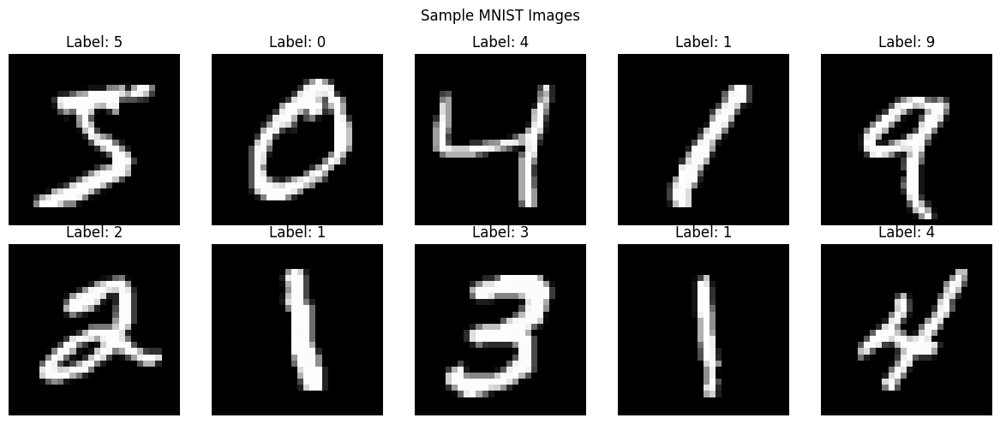

In [2]:
# Define transformations for MNIST dataset
transform = transforms.Compose([
    transforms.ToTensor(),  # Convert images to tensors (values in [0, 1])
])

# Load MNIST dataset
train_dataset = datasets.MNIST(root='./data', train=True, transform=transform, download=True)
test_dataset = datasets.MNIST(root='./data', train=False, transform=transform, download=True)

# Create data loaders
batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=0)

print(f"Training samples: {len(train_dataset)}")
print(f"Test samples: {len(test_dataset)}")
print(f"Image shape: {train_dataset[0][0].shape}")

# Visualize some samples
fig, axes = plt.subplots(2, 5, figsize=(12, 5))
for i, ax in enumerate(axes.flat):
    img, label = train_dataset[i]
    ax.imshow(img.squeeze(), cmap='gray')
    ax.set_title(f'Label: {label}')
    ax.axis('off')
plt.suptitle('Sample MNIST Images')
plt.tight_layout()
plt.show()

##  Variational Autoencoders (VAE)

A VAE is a probabilistic generative model that learns a latent distribution enabling both reconstruction and sampling.

![VAE Architecture](assets/Variational_Autoencoder.png)

Source: https://en.wikipedia.org/wiki/Variational_autoencoder
### Key components
- Encoder: maps input x to latent parameters μ(x), logσ²(x)
- Reparameterization: z = μ + σ ⊙ ε with ε ~ N(0, I) (enables backprop through sampling)
- Decoder: p(x|z) reconstructs inputs from z
- Objective (ELBO): reconstruction term + KL regularizer
  - Reconstruction: BCE between x and x̂ encourages fidelity
  - KL divergence: D_KL[q(z|x) || N(0, I)] regularizes the latent space

This setup yields smooth latent spaces, enabling interpolation and sampling while maintaining meaningful structure.

#### Sources:
- Variational autoencoder (Wikipedia). https://en.wikipedia.org/wiki/Variational_autoencoder
- Lab 11 Reference Materials. https://github.com/ckingkan/AT82.08-computer-vision/blob/main/labs_instructor_copies/lab11.2_VAE.ipynb


### Implementing VAE model

Building a convolutional VAE with an encoder producing μ and logσ², reparameterization for sampling, and a transpose-conv decoder.

In [3]:
class VAE(nn.Module):
    def __init__(self, latent_dim=128):
        super(VAE, self).__init__()
        self.latent_dim = latent_dim
        
        # Encoder: 4 convolutional layers
        # Input: 1 x 28 x 28
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=3, stride=2, padding=1),  # 32 x 14 x 14
            nn.BatchNorm2d(32),
            nn.ReLU(),
            
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),  # 64 x 7 x 7
            nn.BatchNorm2d(64),
            nn.ReLU(),
            
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),  # 128 x 4 x 4
            nn.BatchNorm2d(128),
            nn.ReLU(),
            
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),  # 256 x 2 x 2
            nn.BatchNorm2d(256),
            nn.ReLU(),
        )
        
        # Flattened size after encoder: 256 * 2 * 2 = 1024
        self.flatten_size = 256 * 2 * 2
        
        # Linear layers to produce mean (mu) and log variance (logvar)
        self.fc_mu = nn.Linear(self.flatten_size, latent_dim)
        self.fc_logvar = nn.Linear(self.flatten_size, latent_dim)
        
        # Decoder: Linear layer followed by transpose convolutions
        self.fc_decode = nn.Linear(latent_dim, self.flatten_size)
        
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),  # 128 x 4 x 4
            nn.BatchNorm2d(128),
            nn.ReLU(),
            
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=0),  # 64 x 7 x 7
            nn.BatchNorm2d(64),
            nn.ReLU(),
            
            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),  # 32 x 14 x 14
            nn.BatchNorm2d(32),
            nn.ReLU(),
            
            nn.ConvTranspose2d(32, 1, kernel_size=3, stride=2, padding=1, output_padding=1),  # 1 x 28 x 28
            nn.Sigmoid()  # Output values in [0, 1]
        )
    
    def encode(self, x):
        """Encode input to latent space parameters (mu and logvar)"""
        x = self.encoder(x)
        x = x.view(x.size(0), -1)  # Flatten
        mu = self.fc_mu(x)
        logvar = self.fc_logvar(x)
        return mu, logvar
    
    def reparameterize(self, mu, logvar):
        """Reparameterization trick: z = mu + sigma * epsilon"""
        std = torch.exp(0.5 * logvar)  # Standard deviation
        eps = torch.randn_like(std)  # Sample epsilon from N(0, 1)
        z = mu + eps * std
        return z
    
    def decode(self, z):
        """Decode latent vector to reconstructed image"""
        x = self.fc_decode(z)
        x = x.view(x.size(0), 256, 2, 2)  # Reshape for transpose conv
        x = self.decoder(x)
        return x
    
    def forward(self, x):
        """Forward pass through VAE"""
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        recon_x = self.decode(z)
        return z, mu, logvar, recon_x

# Instantiate the model
vae_128 = VAE(latent_dim=128).to(device)
print(vae_128)
print(f"\nTotal parameters: {sum(p.numel() for p in vae_128.parameters()):,}")

VAE(
  (encoder): Sequential(
    (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU()
    (9): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (10): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU()
  )
  (fc_mu): Linear(in_features=1024, out_features=128, bias=True)
  (fc_logvar): Linear(in_features=1024, out_features=128, bias=True)
  (fc_decode): Linear(in_features=128, out_features=1024, bias=True)
  (decoder): Sequential(
    (0): Con

## Loss Function and Training Setup

The VAE loss consists of two components:
1. **Reconstruction Loss**: Binary Cross-Entropy (BCE) - measures how well the decoder reconstructs the input
2. **KL Divergence**: Measures how close the learned latent distribution is to a standard normal distribution N(0, 1)

In [4]:
def compute_epoch_loss_autoencoder(model, data_loader, loss_fn, device):
    """Compute average loss over entire dataset"""
    model.eval()
    curr_loss = 0.
    num_examples = 0
    
    with torch.no_grad():
        for features, _ in data_loader:
            features = features.to(device)
            
            # Forward pass
            encoded, z_mean, z_log_var, decoded = model(features)
            
            # Compute losses
            batchsize = features.size(0)
            
            # KL divergence
            kl_div = -0.5 * torch.sum(1 + z_log_var - z_mean**2 - torch.exp(z_log_var), axis=1)
            kl_div = kl_div.mean()
            
            # Reconstruction loss
            pixelwise = loss_fn(decoded, features, reduction='none')
            pixelwise = pixelwise.view(batchsize, -1).sum(axis=1)
            pixelwise = pixelwise.mean()
            
            # Combined loss
            loss = pixelwise + kl_div
            
            num_examples += features.size(0)
            curr_loss += loss
            
    curr_loss = curr_loss / len(data_loader)
    return curr_loss

print("Loss computation function defined successfully!")

Loss computation function defined successfully!


### Training VAE with Latent Dimension = 128

In [5]:
# Training configuration
NUM_EPOCHS = 50
LEARNING_RATE = 1e-3
logging_interval = 50
skip_epoch_stats = False

# Loss function
loss_fn = F.binary_cross_entropy

# Optimizer
optimizer_128 = optim.Adam(vae_128.parameters(), lr=LEARNING_RATE)

# Initialize log dictionary
log_dict_128 = {
    'train_combined_loss_per_batch': [],
    'train_combined_loss_per_epoch': [],
    'train_reconstruction_loss_per_batch': [],
    'train_kl_loss_per_batch': []
}

# Dictionary to store latent vectors over epochs
latent_history = {}  # key: epoch, value: (latent_vectors, labels)

# Training loop
print("Training VAE with latent dimension = 128...")
start_time = time.time()

for epoch in range(NUM_EPOCHS):
    vae_128.train()
    
    for batch_idx, (features, _) in enumerate(train_loader):
        features = features.to(device)
        
        # FORWARD PASS
        encoded, z_mean, z_log_var, decoded = vae_128(features)
        
        # COMPUTE LOSSES
        # KL divergence
        kl_div = -0.5 * torch.sum(1 + z_log_var - z_mean**2 - torch.exp(z_log_var), axis=1)
        batchsize = kl_div.size(0)
        kl_div = kl_div.mean()
        
        # Reconstruction loss
        pixelwise = loss_fn(decoded, features, reduction='none')
        pixelwise = pixelwise.view(batchsize, -1).sum(axis=1)
        pixelwise = pixelwise.mean()
        
        # Combined loss
        loss = pixelwise + kl_div
        
        # BACKPROPAGATION
        optimizer_128.zero_grad()
        loss.backward()
        optimizer_128.step()
        
        # LOGGING
        log_dict_128['train_combined_loss_per_batch'].append(loss.item())
        log_dict_128['train_reconstruction_loss_per_batch'].append(pixelwise.item())
        log_dict_128['train_kl_loss_per_batch'].append(kl_div.item())
    
    # Compute epoch-level statistics
    if not skip_epoch_stats:
        vae_128.eval()
        
        with torch.set_grad_enabled(False):
            train_loss = compute_epoch_loss_autoencoder(vae_128, train_loader, loss_fn, device)
            log_dict_128['train_combined_loss_per_epoch'].append(train_loss.item())
            
            # Print only for first epoch and every 5th epoch
            if epoch == 0 or (epoch + 1) % 5 == 0:
                print('***Epoch: %03d/%03d | Loss: %.3f' % (epoch+1, NUM_EPOCHS, train_loss))
    
    # Store latent vectors at first epoch and every 5 epochs
    if epoch == 0 or (epoch + 1) % 5 == 0:
        vae_128.eval()
        latent_vectors = []
        labels_list = []
        
        with torch.no_grad():
            for images, labels in test_loader:
                images = images.to(device)
                mu, _ = vae_128.encode(images)
                latent_vectors.append(mu.cpu().numpy())
                labels_list.append(labels.numpy())
        
        latent_vectors = np.concatenate(latent_vectors, axis=0)
        labels_list = np.concatenate(labels_list, axis=0)
        latent_history[epoch + 1] = (latent_vectors, labels_list)
        print(f'Latent vectors stored for epoch {epoch + 1}')
        print('Time elapsed: %.2f min' % ((time.time() - start_time)/60))

print('\nTotal Training Time: %.2f min' % ((time.time() - start_time)/60))
print("Training completed!")

# Save the model
torch.save(vae_128.state_dict(), 'vae_128.pth')
print("Model saved as 'vae_128.pth'")

Training VAE with latent dimension = 128...
***Epoch: 001/050 | Loss: 122.944
Latent vectors stored for epoch 1
Time elapsed: 0.38 min
***Epoch: 005/050 | Loss: 102.253
Latent vectors stored for epoch 5
Time elapsed: 1.80 min
***Epoch: 010/050 | Loss: 99.013
Latent vectors stored for epoch 10
Time elapsed: 3.55 min
***Epoch: 015/050 | Loss: 97.594
Latent vectors stored for epoch 15
Time elapsed: 5.31 min
***Epoch: 020/050 | Loss: 96.574
Latent vectors stored for epoch 20
Time elapsed: 7.08 min
***Epoch: 025/050 | Loss: 95.821
Latent vectors stored for epoch 25
Time elapsed: 8.85 min
***Epoch: 030/050 | Loss: 95.112
Latent vectors stored for epoch 30
Time elapsed: 10.61 min
***Epoch: 035/050 | Loss: 94.878
Latent vectors stored for epoch 35
Time elapsed: 12.33 min
***Epoch: 040/050 | Loss: 94.564
Latent vectors stored for epoch 40
Time elapsed: 14.05 min
***Epoch: 045/050 | Loss: 94.191
Latent vectors stored for epoch 45
Time elapsed: 15.77 min
***Epoch: 050/050 | Loss: 93.684
Latent ve

### Visualizing Training Progress

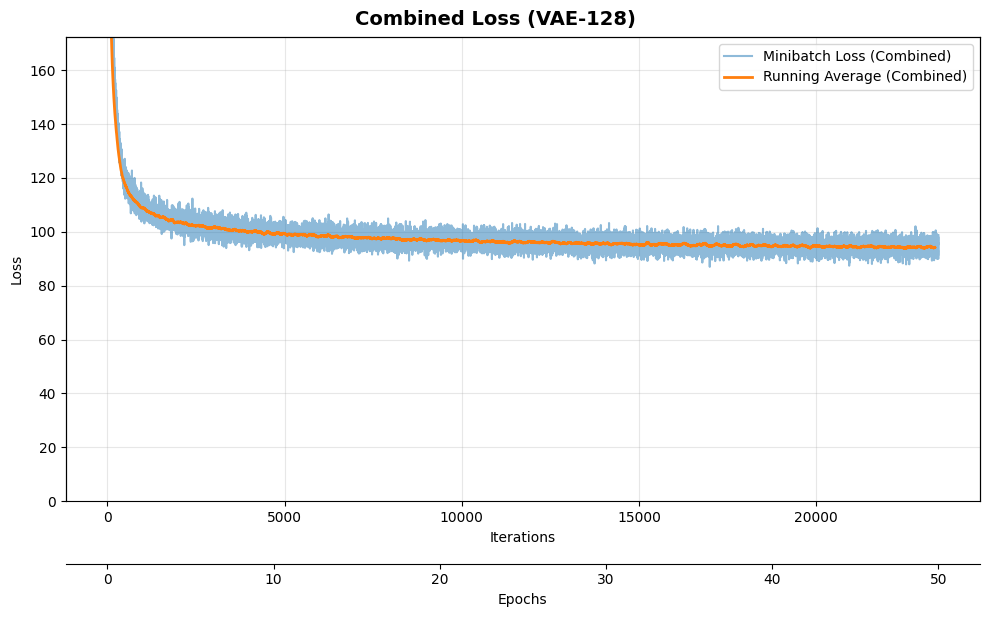

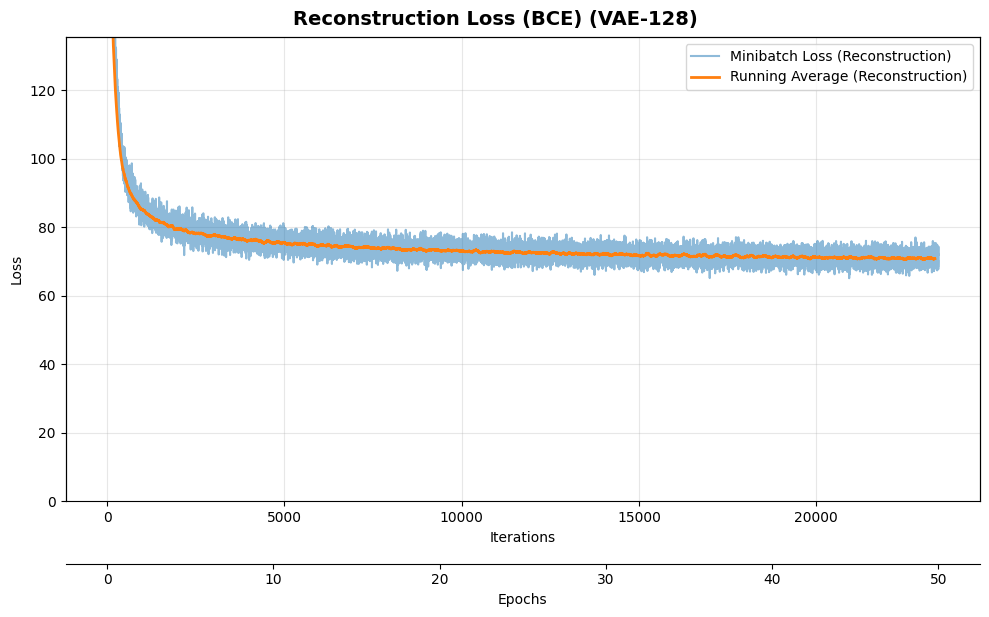

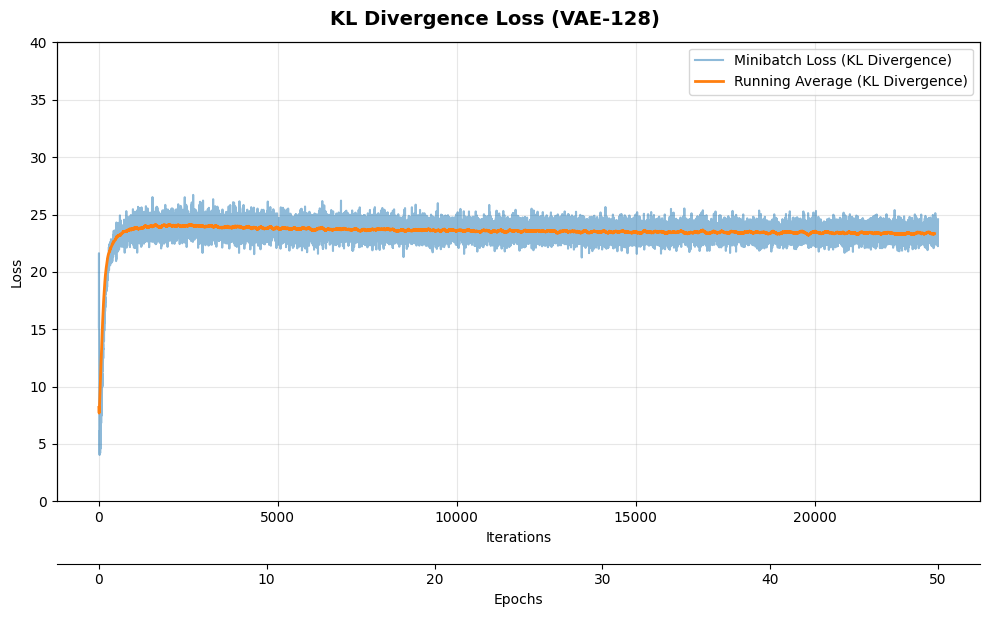

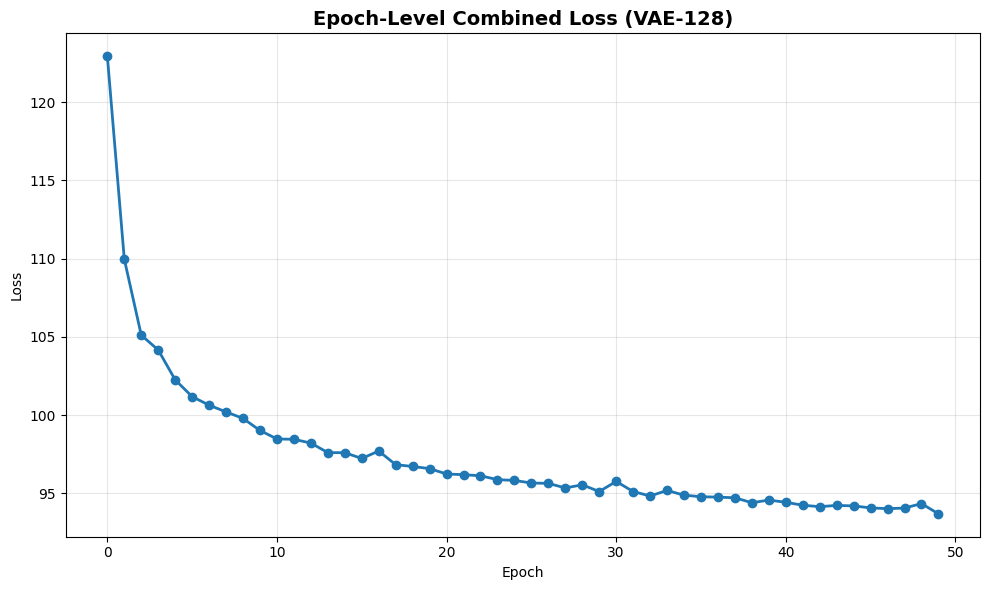

In [6]:
def plot_training_loss(minibatch_losses, num_epochs, averaging_iterations=100, custom_label=''):
    """
    Plot training loss with running average
    
    Args:
        minibatch_losses: List of per-batch losses
        num_epochs: Number of training epochs
        averaging_iterations: Window size for running average
        custom_label: Custom label suffix for the plot
    """
    iter_per_epoch = len(minibatch_losses) // num_epochs

    plt.figure(figsize=(10, 6))
    ax1 = plt.subplot(1, 1, 1)
    ax1.plot(range(len(minibatch_losses)),
             (minibatch_losses), label=f'Minibatch Loss{custom_label}', alpha=0.5)
    ax1.set_xlabel('Iterations')
    ax1.set_ylabel('Loss')

    if len(minibatch_losses) < 1000:
        num_losses = len(minibatch_losses) // 2
    else:
        num_losses = 1000

    ax1.set_ylim([
        0, np.max(minibatch_losses[num_losses:])*1.5
        ])

    ax1.plot(np.convolve(minibatch_losses,
                         np.ones(averaging_iterations,)/averaging_iterations,
                         mode='valid'),
             label=f'Running Average{custom_label}', linewidth=2)
    ax1.legend()
    ax1.grid(True, alpha=0.3)

    ###################
    # Set second x-axis
    ax2 = ax1.twiny()
    newlabel = list(range(num_epochs+1))

    newpos = [e*iter_per_epoch for e in newlabel]

    ax2.set_xticks(newpos[::10])
    ax2.set_xticklabels(newlabel[::10])

    ax2.xaxis.set_ticks_position('bottom')
    ax2.xaxis.set_label_position('bottom')
    ax2.spines['bottom'].set_position(('outward', 45))
    ax2.set_xlabel('Epochs')
    ax2.set_xlim(ax1.get_xlim())
    ###################

    plt.tight_layout()

# Plot combined loss
plot_training_loss(log_dict_128['train_combined_loss_per_batch'], NUM_EPOCHS, 
                   averaging_iterations=100, custom_label=' (Combined)')
plt.suptitle('Combined Loss (VAE-128)', fontsize=14, fontweight='bold', y=1.02)
plt.show()

# Plot reconstruction loss
plot_training_loss(log_dict_128['train_reconstruction_loss_per_batch'], NUM_EPOCHS, 
                   averaging_iterations=100, custom_label=' (Reconstruction)')
plt.suptitle('Reconstruction Loss (BCE) (VAE-128)', fontsize=14, fontweight='bold', y=1.02)
plt.show()

# Plot KL divergence loss
plot_training_loss(log_dict_128['train_kl_loss_per_batch'], NUM_EPOCHS, 
                   averaging_iterations=100, custom_label=' (KL Divergence)')
plt.suptitle('KL Divergence Loss (VAE-128)', fontsize=14, fontweight='bold', y=1.02)
plt.show()

# Also plot epoch-level combined loss
if log_dict_128['train_combined_loss_per_epoch']:
    plt.figure(figsize=(10, 6))
    plt.plot(log_dict_128['train_combined_loss_per_epoch'], marker='o', linewidth=2)
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Epoch-Level Combined Loss (VAE-128)', fontsize=14, fontweight='bold')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

## Visualization of Reconstruction and Latent Space Evolution

### Reconstruction Visualization

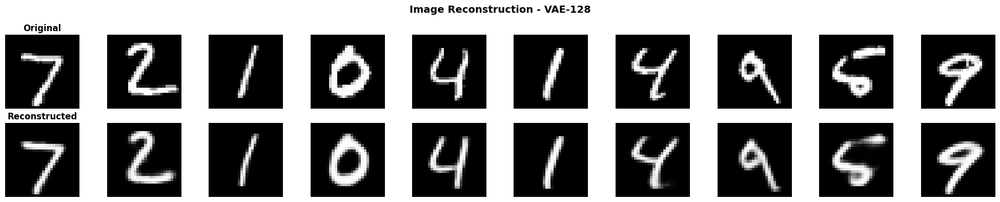

In [7]:
# Visualize reconstructions
vae_128.eval()

# Get a batch of test images
test_images, test_labels = next(iter(test_loader))
test_images = test_images.to(device)

# Reconstruct images
with torch.no_grad():
    encoded, mu, logvar, recon_images = vae_128(test_images)

# Move to CPU for visualization
test_images = test_images.cpu()
recon_images = recon_images.cpu()

# Plot original and reconstructed images
n_images = 10
fig, axes = plt.subplots(2, n_images, figsize=(20, 4))

for i in range(n_images):
    # Original images
    axes[0, i].imshow(test_images[i].squeeze(), cmap='gray')
    axes[0, i].axis('off')
    if i == 0:
        axes[0, i].set_title('Original', fontsize=12, fontweight='bold')
    
    # Reconstructed images
    axes[1, i].imshow(recon_images[i].squeeze(), cmap='gray')
    axes[1, i].axis('off')
    if i == 0:
        axes[1, i].set_title('Reconstructed', fontsize=12, fontweight='bold')

plt.suptitle('Image Reconstruction - VAE-128', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

### Latent Space Evolution Visualization (2D Projection using PCA)

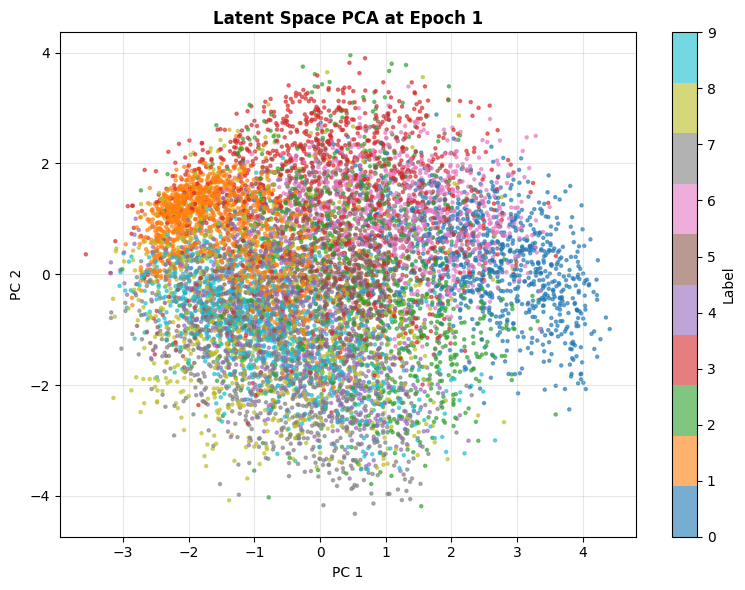

Epoch 1 - Explained variance: 0.1754


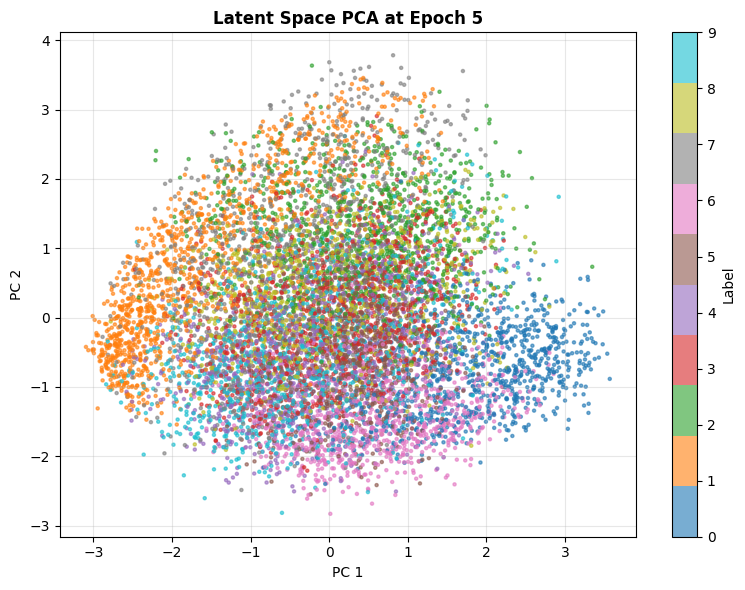

Epoch 5 - Explained variance: 0.1648


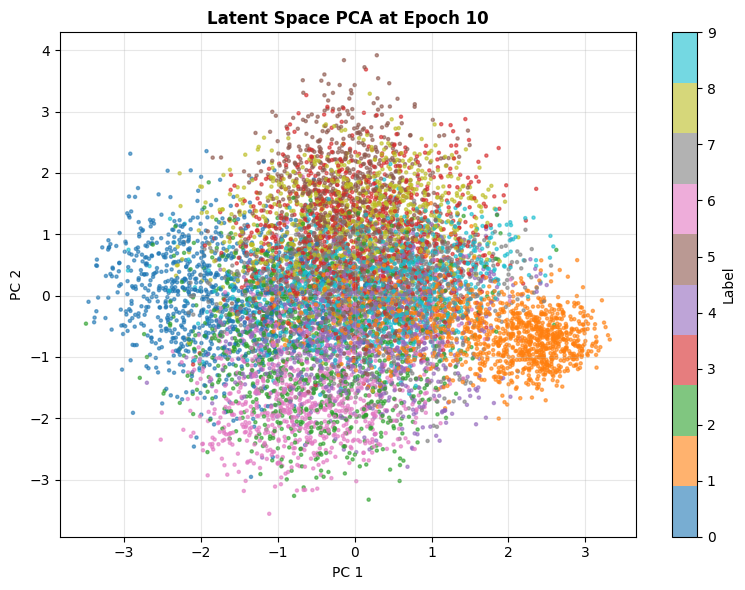

Epoch 10 - Explained variance: 0.1629


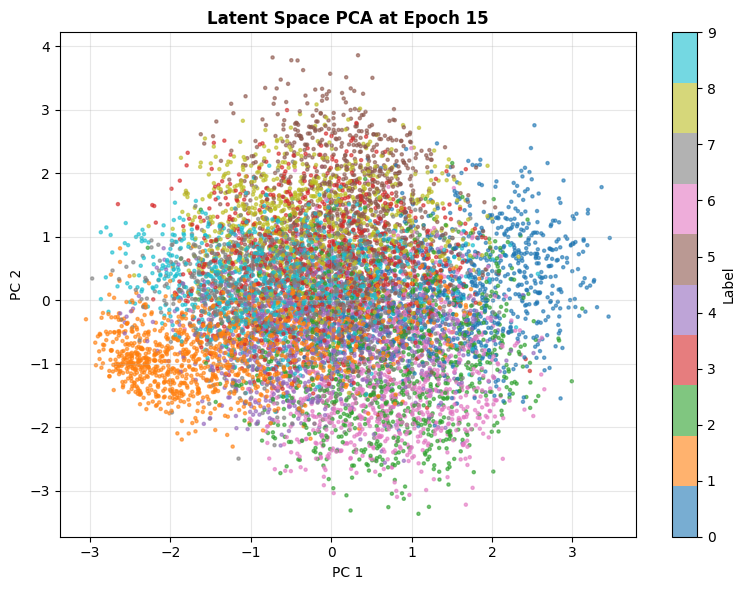

Epoch 15 - Explained variance: 0.1626


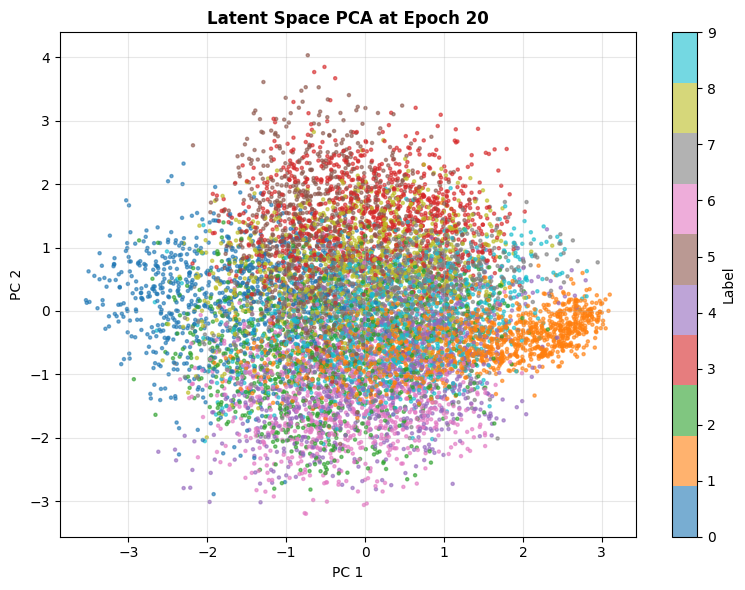

Epoch 20 - Explained variance: 0.1650


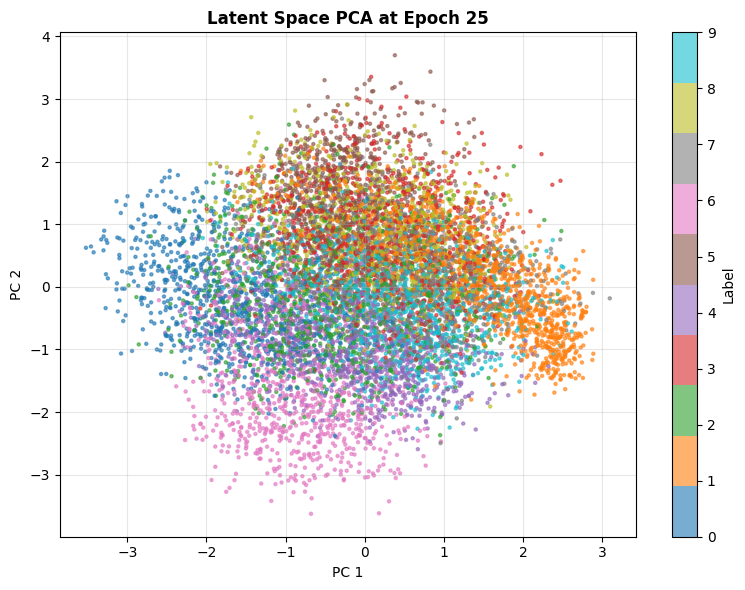

Epoch 25 - Explained variance: 0.1672


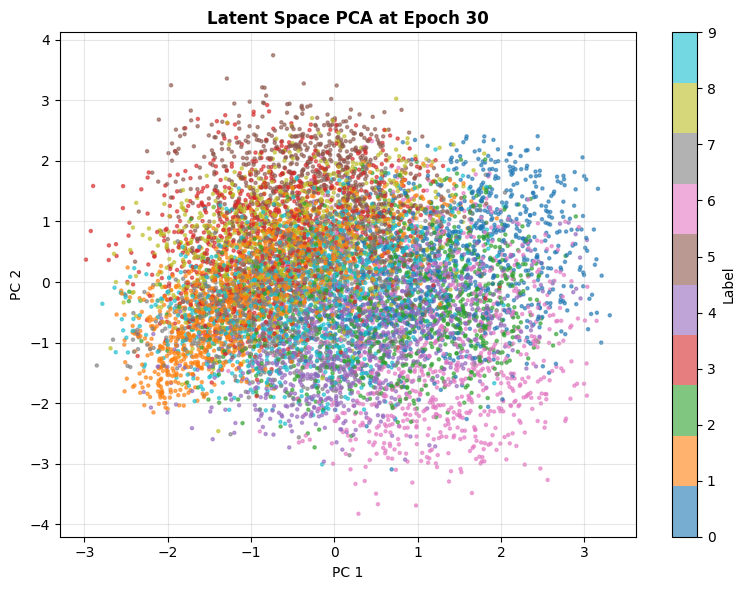

Epoch 30 - Explained variance: 0.1713


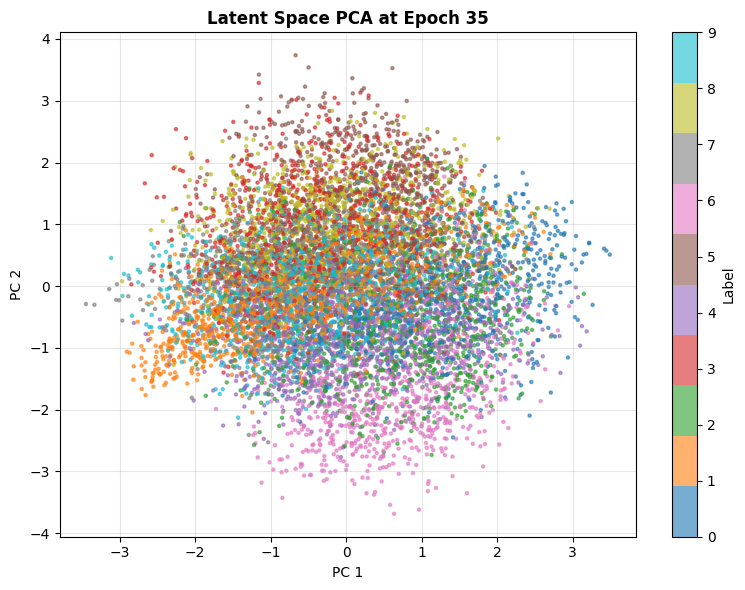

Epoch 35 - Explained variance: 0.1676


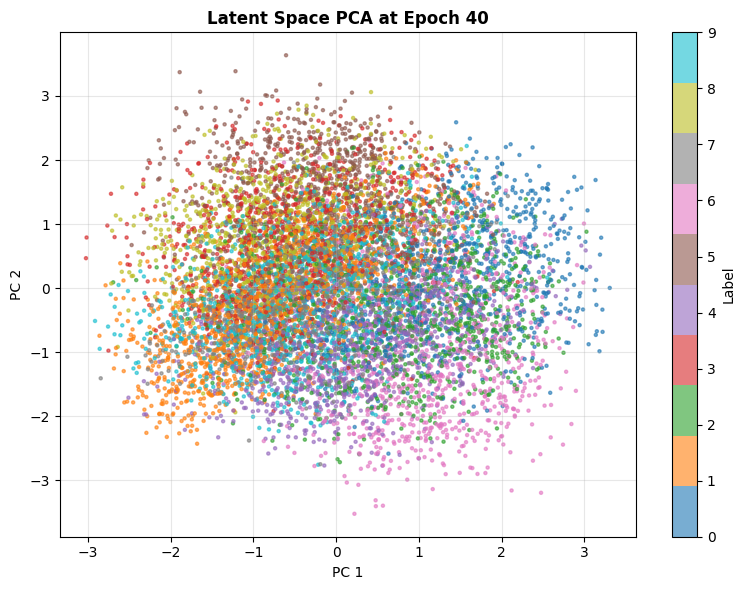

Epoch 40 - Explained variance: 0.1698


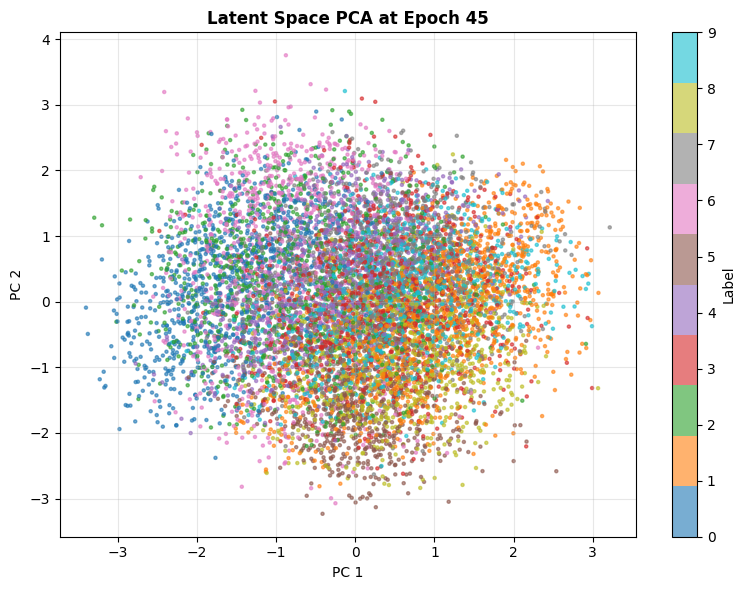

Epoch 45 - Explained variance: 0.1679


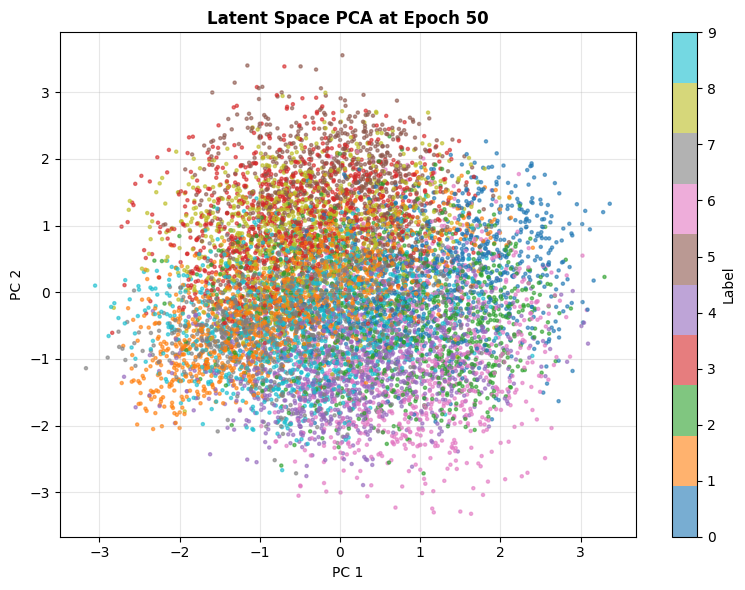

Epoch 50 - Explained variance: 0.1687


In [8]:
# Visualize latent space evolution using PCA (2D)
for epoch, (latent_vectors, labels_list) in latent_history.items():
    pca = PCA(n_components=2)
    latent_2d = pca.fit_transform(latent_vectors)
    
    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(latent_2d[:, 0], latent_2d[:, 1], c=labels_list, cmap='tab10', s=5, alpha=0.6)
    plt.colorbar(scatter, label='Label')
    plt.xlabel('PC 1')
    plt.ylabel('PC 2')
    plt.title(f'Latent Space PCA at Epoch {epoch}', fontsize=12, fontweight='bold')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    print(f"Epoch {epoch} - Explained variance: {pca.explained_variance_ratio_.sum():.4f}")

### Latent Space Evolution Visualization (3D Projection using PCA)

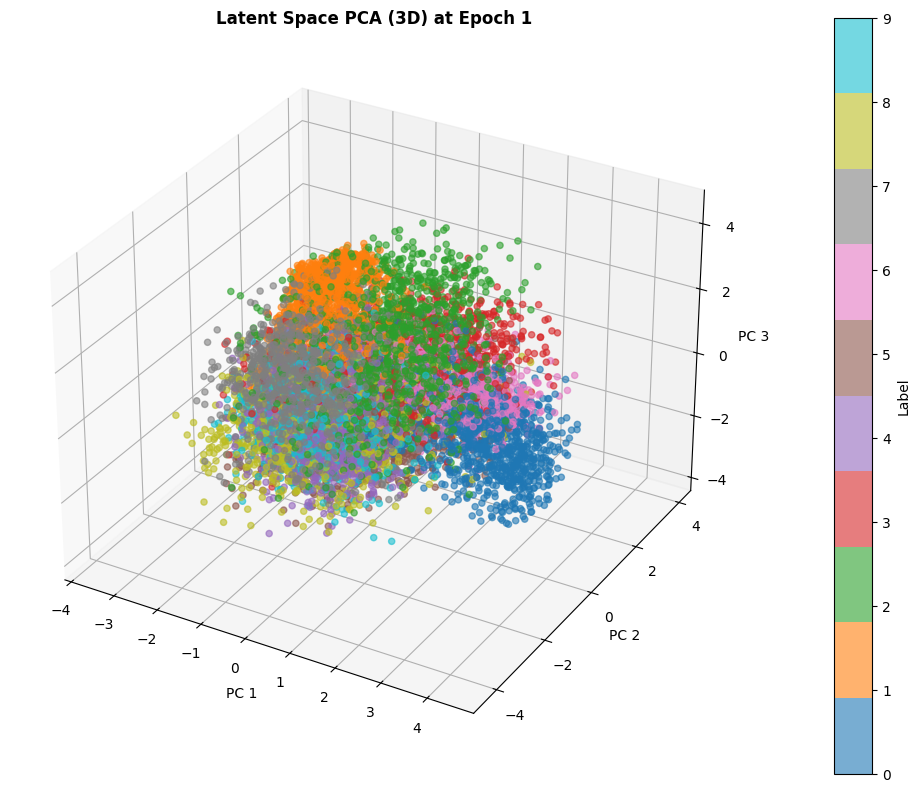

Epoch 1 - Explained variance: 0.2552


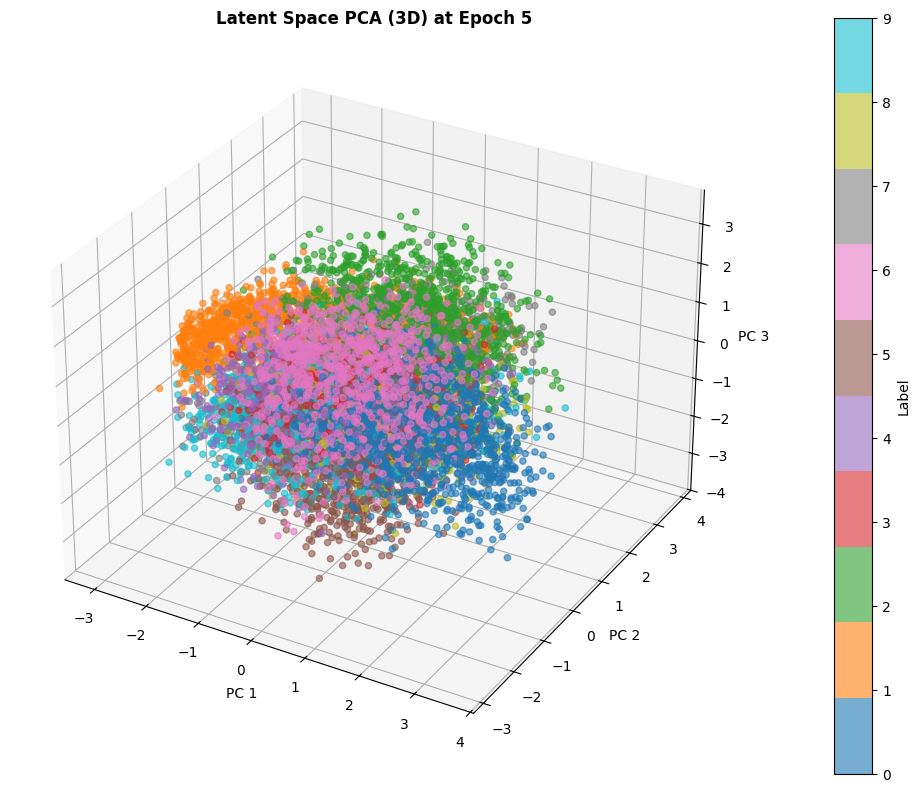

Epoch 5 - Explained variance: 0.2378


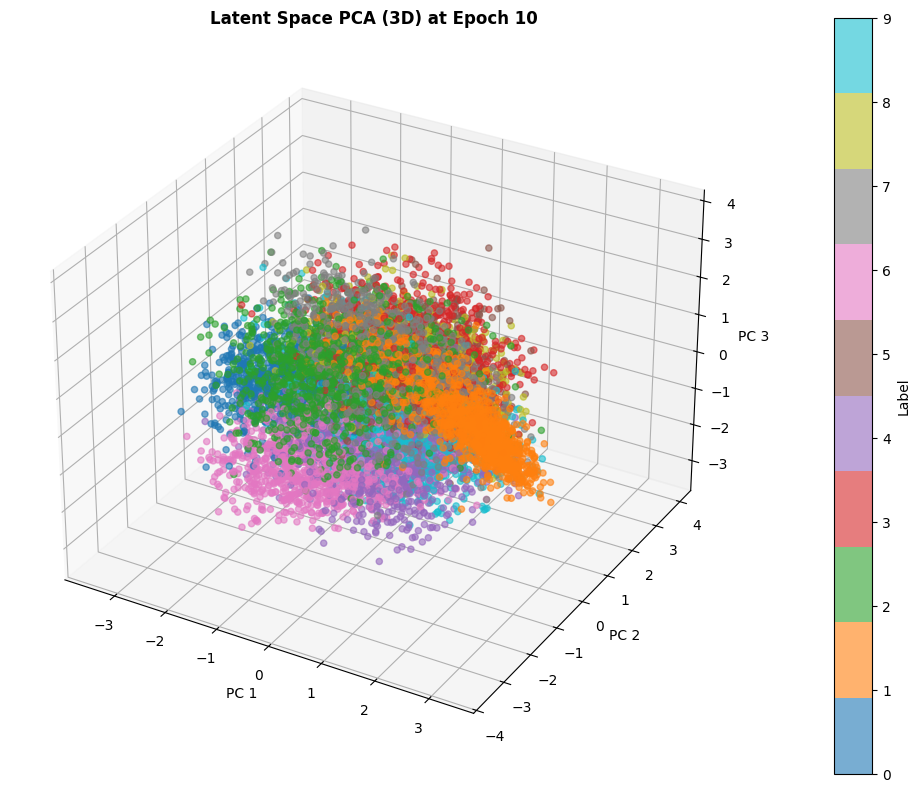

Epoch 10 - Explained variance: 0.2364


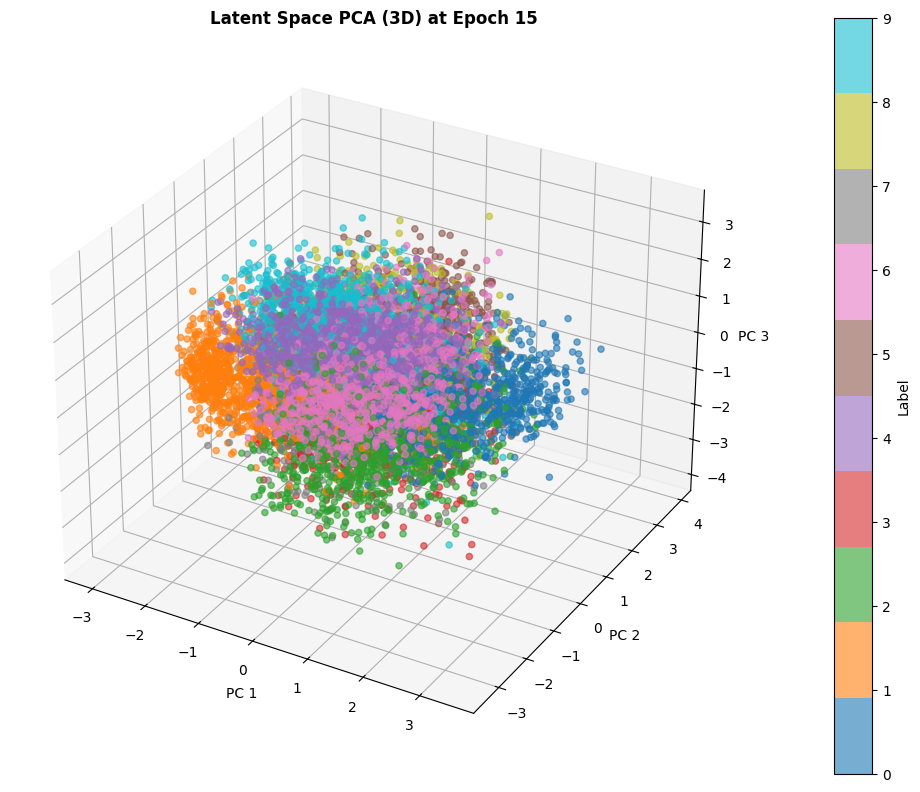

Epoch 15 - Explained variance: 0.2356


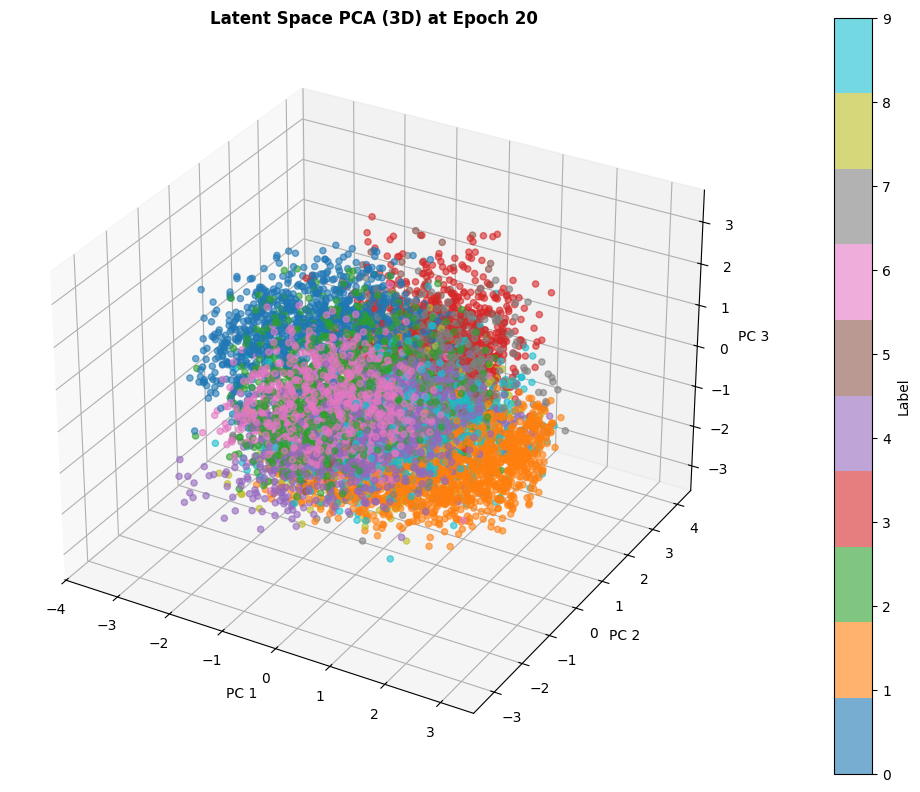

Epoch 20 - Explained variance: 0.2388


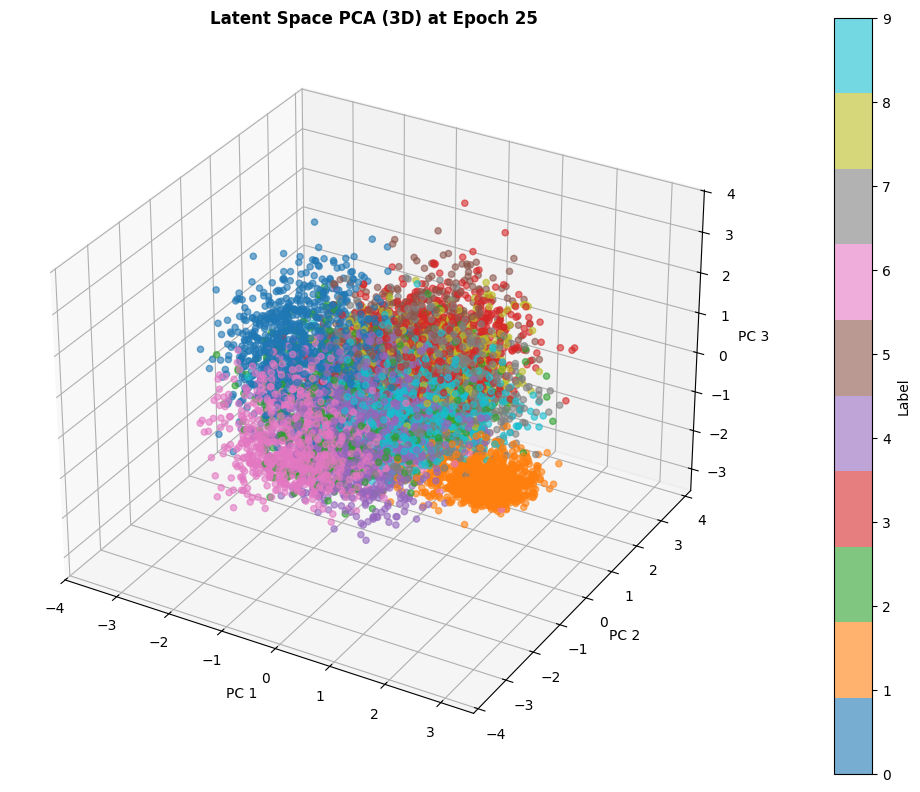

Epoch 25 - Explained variance: 0.2422


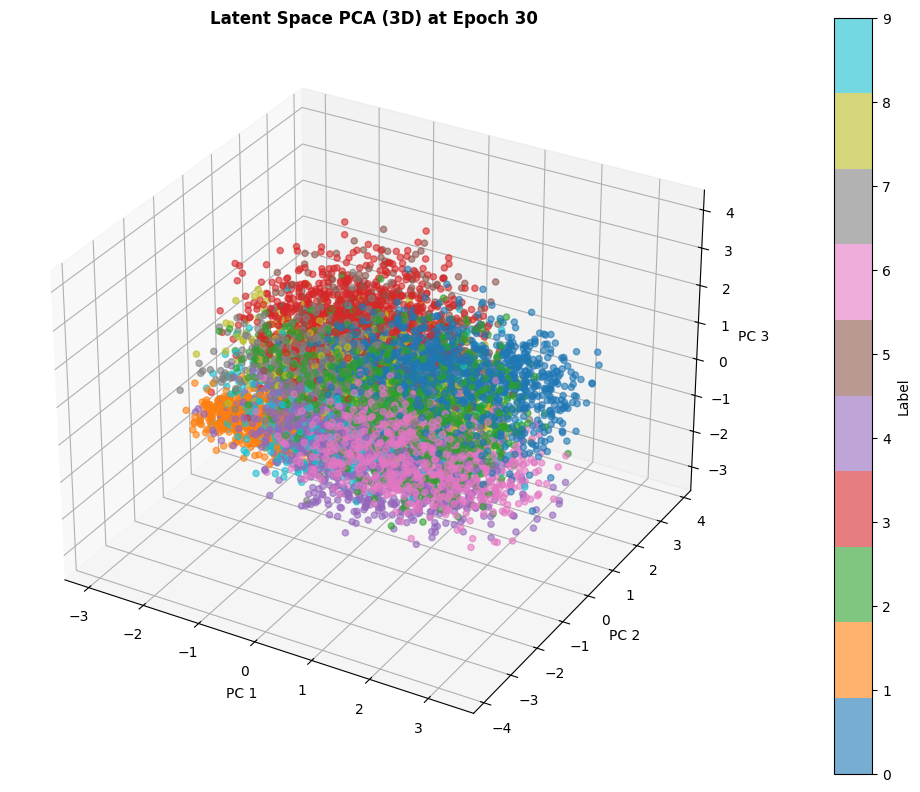

Epoch 30 - Explained variance: 0.2495


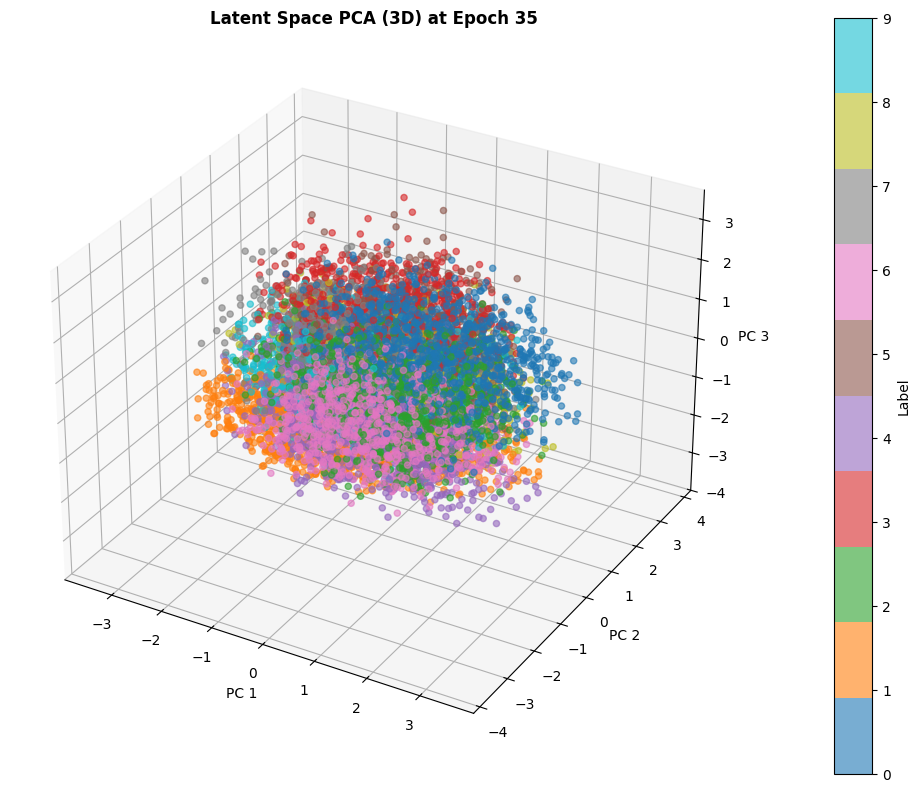

Epoch 35 - Explained variance: 0.2411


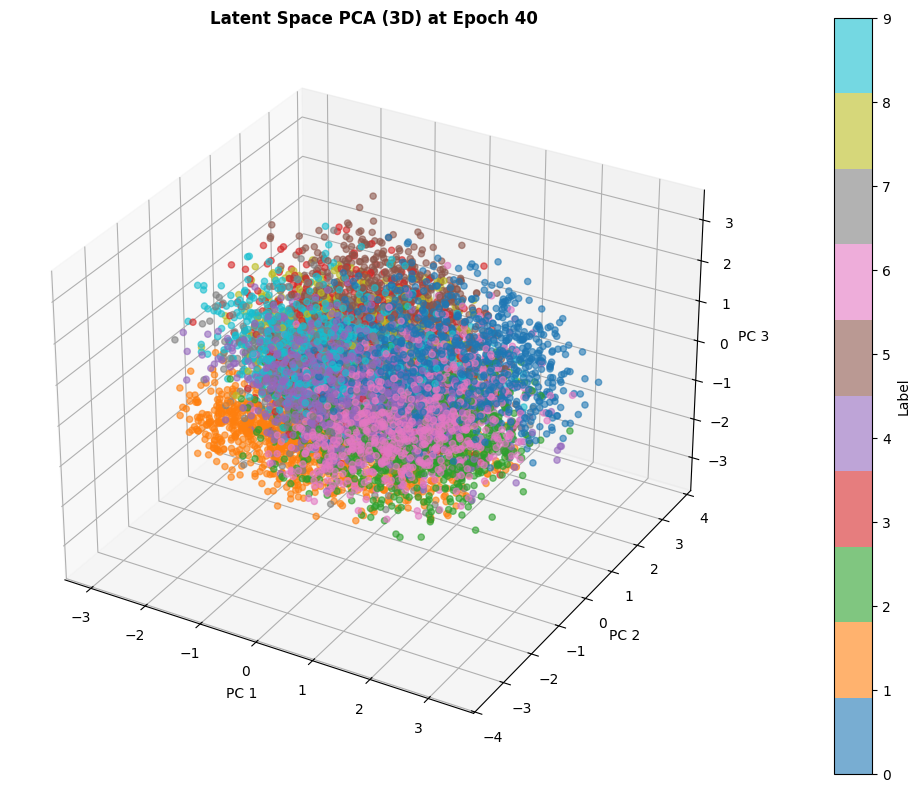

Epoch 40 - Explained variance: 0.2452


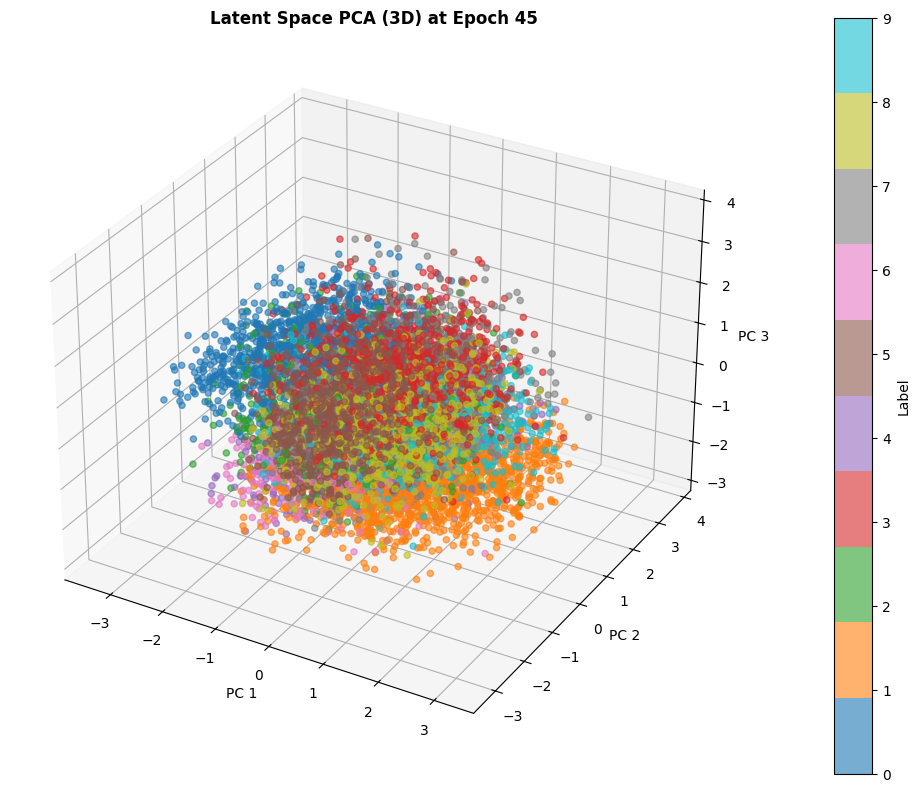

Epoch 45 - Explained variance: 0.2466


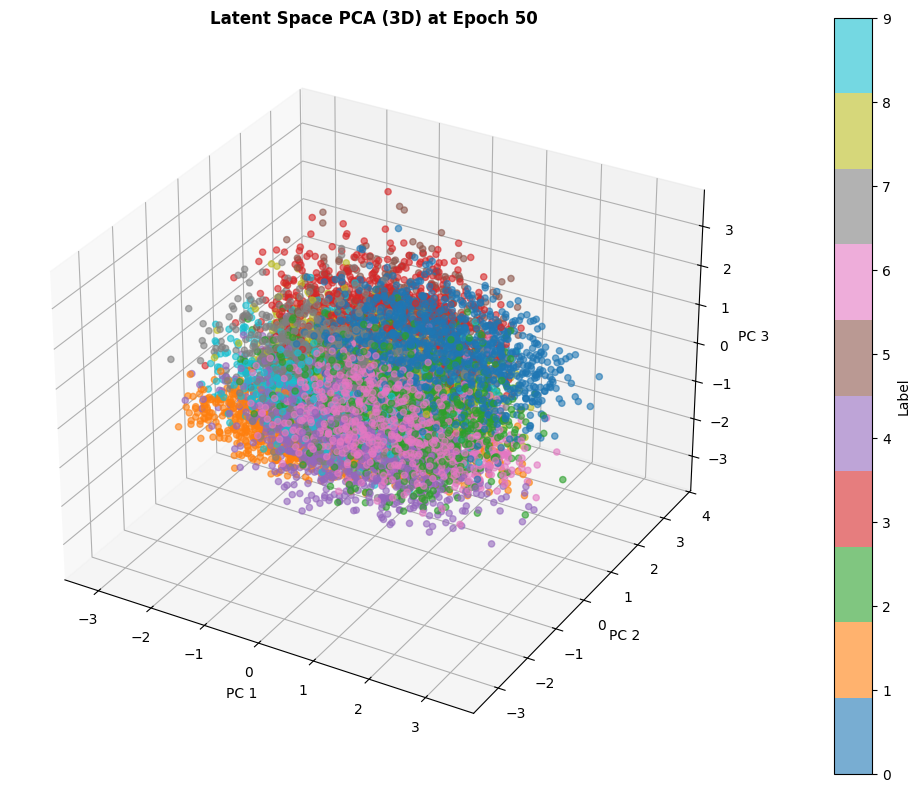

Epoch 50 - Explained variance: 0.2454


In [9]:
for epoch, (latent_vectors, labels_list) in latent_history.items():
    # Reduce to 3D
    pca = PCA(n_components=3)
    latent_3d = pca.fit_transform(latent_vectors)
    
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    scatter = ax.scatter(
        latent_3d[:, 0], latent_3d[:, 1], latent_3d[:, 2],
        c=labels_list, cmap='tab10', s=20, alpha=0.6
    )
    
    cbar = fig.colorbar(scatter, ax=ax, pad=0.1)
    cbar.set_label('Label')
    
    ax.set_xlabel('PC 1')
    ax.set_ylabel('PC 2')
    ax.set_zlabel('PC 3')
    ax.set_title(f'Latent Space PCA (3D) at Epoch {epoch}', fontsize=12, fontweight='bold')
    
    plt.tight_layout()
    plt.show()
    
    print(f"Epoch {epoch} - Explained variance: {pca.explained_variance_ratio_.sum():.4f}")

## Image Generation and Interpolation

### Generating New Images from Random Latent Vectors

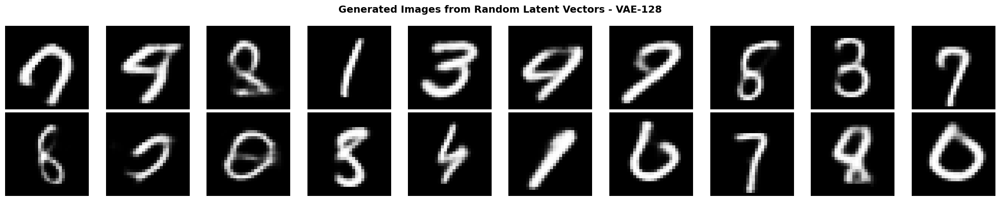

In [10]:
# Generate new images by sampling from N(0, 1)
vae_128.eval()

n_samples = 20
with torch.no_grad():
    # Sample random latent vectors from standard normal distribution
    z = torch.randn(n_samples, vae_128.latent_dim).to(device)
    
    # Decode to generate images
    generated_images = vae_128.decode(z).cpu()

# Plot generated images
fig, axes = plt.subplots(2, 10, figsize=(20, 4))
for i in range(n_samples):
    row = i // 10
    col = i % 10
    axes[row, col].imshow(generated_images[i].squeeze(), cmap='gray')
    axes[row, col].axis('off')

plt.suptitle('Generated Images from Random Latent Vectors - VAE-128', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

### Interpolation Between Two Latent Vectors

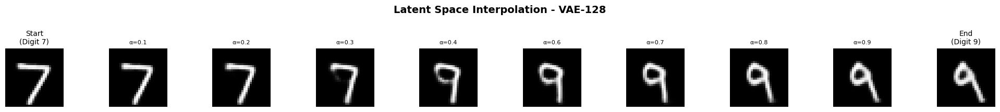

In [11]:
# Select two images from test set and interpolate between their latent representations
vae_128.eval()

# Get two different images (e.g., different digits)
idx1, idx2 = 0, 7  # You can change these indices
img1, label1 = test_dataset[idx1]
img2, label2 = test_dataset[idx2]

# Encode the two images
with torch.no_grad():
    img1_tensor = img1.unsqueeze(0).to(device)
    img2_tensor = img2.unsqueeze(0).to(device)
    
    mu1, _ = vae_128.encode(img1_tensor)
    mu2, _ = vae_128.encode(img2_tensor)
    
    # Interpolate between the two latent vectors
    n_steps = 10
    interpolated_images = []
    
    for alpha in np.linspace(0, 1, n_steps):
        # Linear interpolation: z = (1 - alpha) * z1 + alpha * z2
        z_interp = (1 - alpha) * mu1 + alpha * mu2
        
        # Decode interpolated latent vector
        img_interp = vae_128.decode(z_interp).cpu()
        interpolated_images.append(img_interp.squeeze())

# Plot the interpolation
fig, axes = plt.subplots(1, n_steps, figsize=(20, 2))
for i in range(n_steps):
    axes[i].imshow(interpolated_images[i], cmap='gray')
    axes[i].axis('off')
    if i == 0:
        axes[i].set_title(f'Start\n(Digit {label1})', fontsize=10)
    elif i == n_steps - 1:
        axes[i].set_title(f'End\n(Digit {label2})', fontsize=10)
    else:
        axes[i].set_title(f'α={i/(n_steps-1):.1f}', fontsize=8)

plt.suptitle('Latent Space Interpolation - VAE-128', fontsize=14, fontweight='bold', y=1.05)
plt.tight_layout()
plt.show()

### Multiple Interpolations

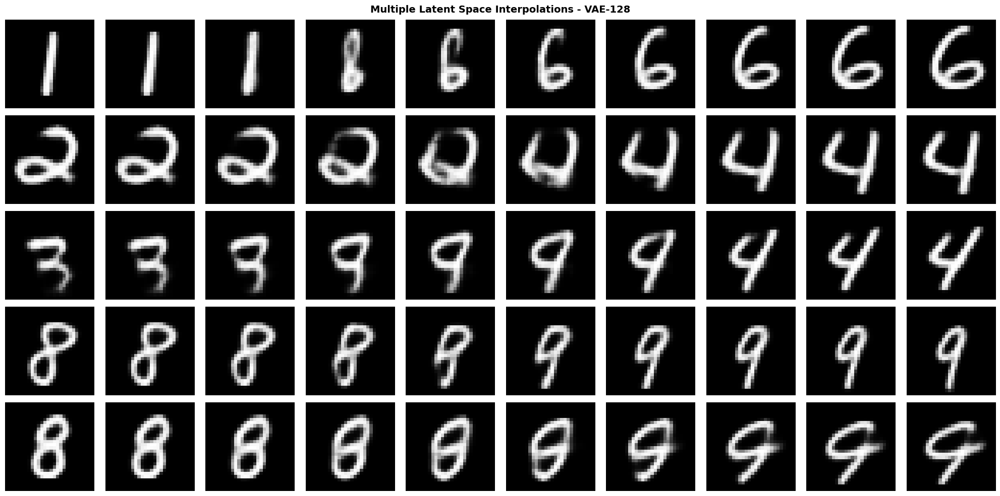

In [12]:
# Perform interpolation for multiple pairs
n_pairs = 5
n_steps = 10

fig, axes = plt.subplots(n_pairs, n_steps, figsize=(20, 10))

for pair_idx in range(n_pairs):
    # Select two random images
    idx1 = np.random.randint(0, len(test_dataset))
    idx2 = np.random.randint(0, len(test_dataset))
    
    img1, label1 = test_dataset[idx1]
    img2, label2 = test_dataset[idx2]
    
    with torch.no_grad():
        img1_tensor = img1.unsqueeze(0).to(device)
        img2_tensor = img2.unsqueeze(0).to(device)
        
        mu1, _ = vae_128.encode(img1_tensor)
        mu2, _ = vae_128.encode(img2_tensor)
        
        for step_idx, alpha in enumerate(np.linspace(0, 1, n_steps)):
            z_interp = (1 - alpha) * mu1 + alpha * mu2
            img_interp = vae_128.decode(z_interp).cpu().squeeze()
            
            axes[pair_idx, step_idx].imshow(img_interp, cmap='gray')
            axes[pair_idx, step_idx].axis('off')
            
            # Add labels for start and end
            if step_idx == 0:
                axes[pair_idx, step_idx].set_ylabel(f'{label1} → {label2}', fontsize=10, rotation=0, 
                                                     labelpad=30, va='center')

plt.suptitle('Multiple Latent Space Interpolations - VAE-128', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## VAE with Latent Dimension = 256

Now we will train a second VAE with latent dimension of 256 and compare their reconstruction and image generation.

In [13]:
# Create VAE with latent dimension = 256
vae_256 = VAE(latent_dim=256).to(device)
print(f"VAE-256 Total parameters: {sum(p.numel() for p in vae_256.parameters()):,}")

# Optimizer
optimizer_256 = optim.Adam(vae_256.parameters(), lr=LEARNING_RATE)

# Initialize log dictionary
log_dict_256 = {
    'train_combined_loss_per_batch': [],
    'train_combined_loss_per_epoch': [],
    'train_reconstruction_loss_per_batch': [],
    'train_kl_loss_per_batch': []
}

# Dictionary to store latent vectors over epochs
latent_history_256 = {}  # key: epoch, value: (latent_vectors, labels)

# Training loop
print("\nTraining VAE with latent dimension = 256...")
start_time = time.time()

for epoch in range(NUM_EPOCHS):
    vae_256.train()
    
    for batch_idx, (features, _) in enumerate(train_loader):
        features = features.to(device)
        
        # FORWARD PASS
        encoded, z_mean, z_log_var, decoded = vae_256(features)
        
        # COMPUTE LOSSES
        # KL divergence
        kl_div = -0.5 * torch.sum(1 + z_log_var - z_mean**2 - torch.exp(z_log_var), axis=1)
        batchsize = kl_div.size(0)
        kl_div = kl_div.mean()
        
        # Reconstruction loss
        pixelwise = loss_fn(decoded, features, reduction='none')
        pixelwise = pixelwise.view(batchsize, -1).sum(axis=1)
        pixelwise = pixelwise.mean()
        
        # Combined loss
        loss = pixelwise + kl_div
        
        # BACKPROPAGATION
        optimizer_256.zero_grad()
        loss.backward()
        optimizer_256.step()
        
        # LOGGING
        log_dict_256['train_combined_loss_per_batch'].append(loss.item())
        log_dict_256['train_reconstruction_loss_per_batch'].append(pixelwise.item())
        log_dict_256['train_kl_loss_per_batch'].append(kl_div.item())
    
    # Compute epoch-level statistics
    if not skip_epoch_stats:
        vae_256.eval()
        
        with torch.set_grad_enabled(False):
            train_loss = compute_epoch_loss_autoencoder(vae_256, train_loader, loss_fn, device)
            log_dict_256['train_combined_loss_per_epoch'].append(train_loss.item())
            
            # Print only for first epoch and every 5th epoch
            if epoch == 0 or (epoch + 1) % 5 == 0:
                print('***Epoch: %03d/%03d | Loss: %.3f' % (epoch+1, NUM_EPOCHS, train_loss))
    
    # Store latent vectors at first epoch and every 5 epochs
    if epoch == 0 or (epoch + 1) % 5 == 0:
        vae_256.eval()
        latent_vectors = []
        labels_list = []
        
        with torch.no_grad():
            for images, labels in test_loader:
                images = images.to(device)
                mu, _ = vae_256.encode(images)
                latent_vectors.append(mu.cpu().numpy())
                labels_list.append(labels.numpy())
        
        latent_vectors = np.concatenate(latent_vectors, axis=0)
        labels_list = np.concatenate(labels_list, axis=0)
        latent_history_256[epoch + 1] = (latent_vectors, labels_list)
        print(f'Latent vectors stored for epoch {epoch + 1}')
        print('Time elapsed: %.2f min' % ((time.time() - start_time)/60))

print('\nTotal Training Time: %.2f min' % ((time.time() - start_time)/60))
print("Training completed!")

# Save the model
torch.save(vae_256.state_dict(), 'vae_256.pth')
print("Model saved as 'vae_256.pth'")

VAE-256 Total parameters: 1,564,801

Training VAE with latent dimension = 256...
***Epoch: 001/050 | Loss: 135.329
Latent vectors stored for epoch 1
Time elapsed: 0.37 min
***Epoch: 005/050 | Loss: 104.665
Latent vectors stored for epoch 5
Time elapsed: 1.75 min
***Epoch: 010/050 | Loss: 100.318
Latent vectors stored for epoch 10
Time elapsed: 3.47 min
***Epoch: 015/050 | Loss: 97.633
Latent vectors stored for epoch 15
Time elapsed: 5.21 min
***Epoch: 020/050 | Loss: 96.954
Latent vectors stored for epoch 20
Time elapsed: 6.93 min
***Epoch: 025/050 | Loss: 96.002
Latent vectors stored for epoch 25
Time elapsed: 8.66 min
***Epoch: 030/050 | Loss: 96.067
Latent vectors stored for epoch 30
Time elapsed: 10.39 min
***Epoch: 035/050 | Loss: 95.046
Latent vectors stored for epoch 35
Time elapsed: 12.11 min
***Epoch: 040/050 | Loss: 94.725
Latent vectors stored for epoch 40
Time elapsed: 13.84 min
***Epoch: 045/050 | Loss: 94.255
Latent vectors stored for epoch 45
Time elapsed: 15.57 min
***E

### Visualizing Training Progress for VAE-256

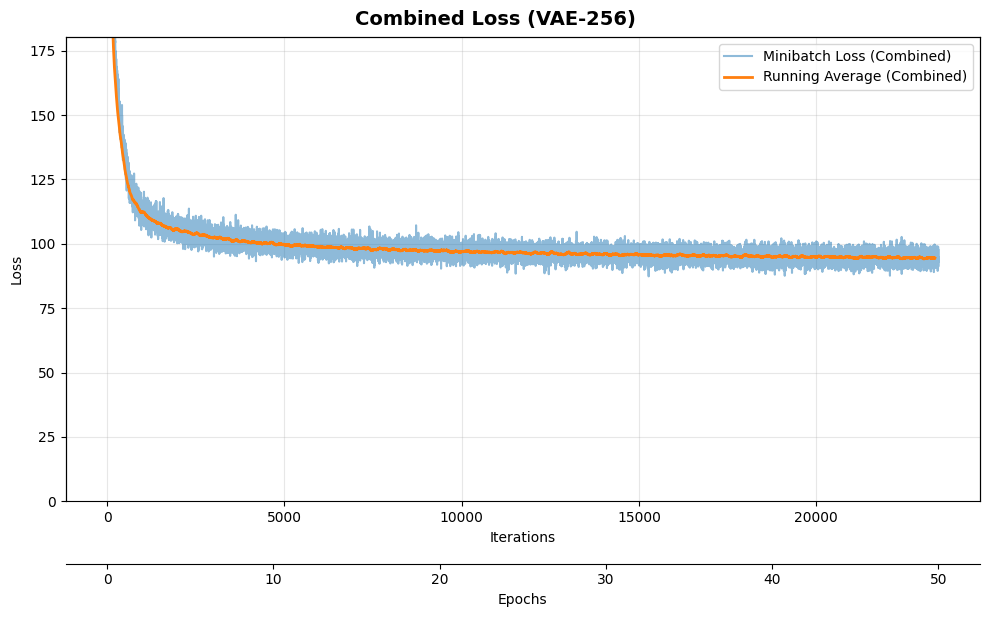

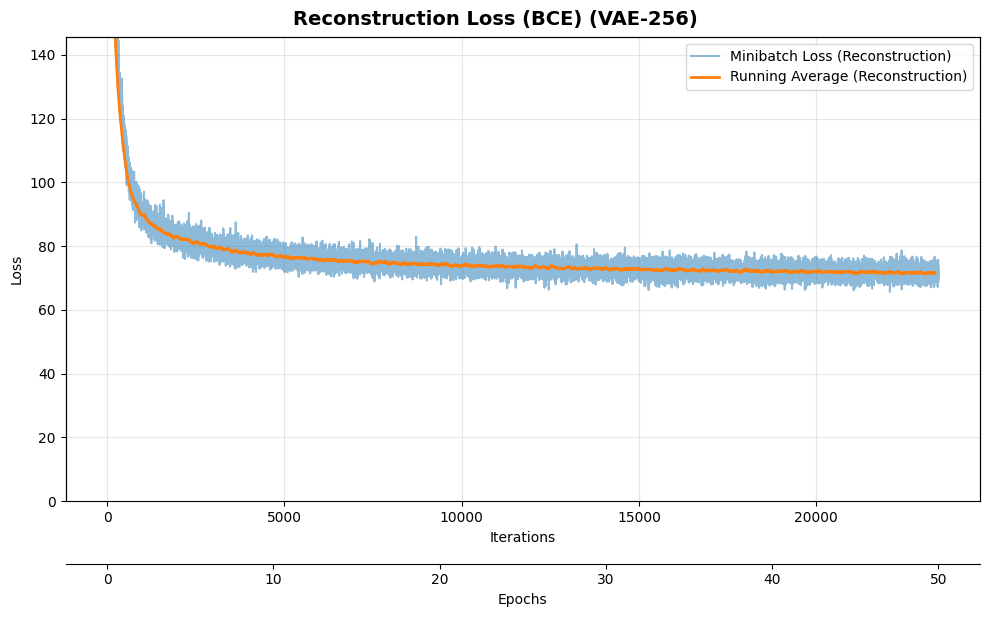

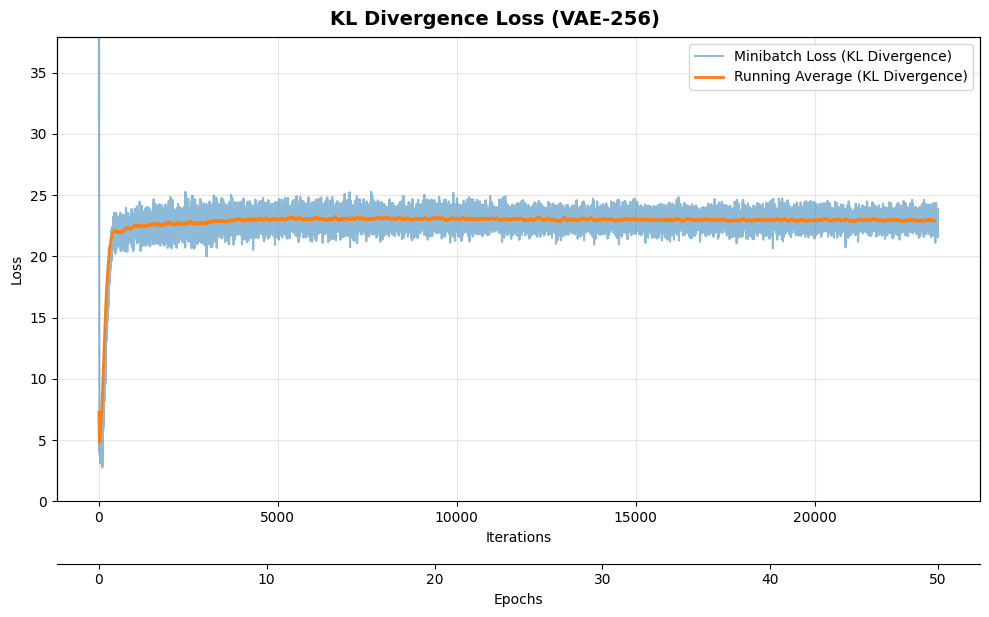

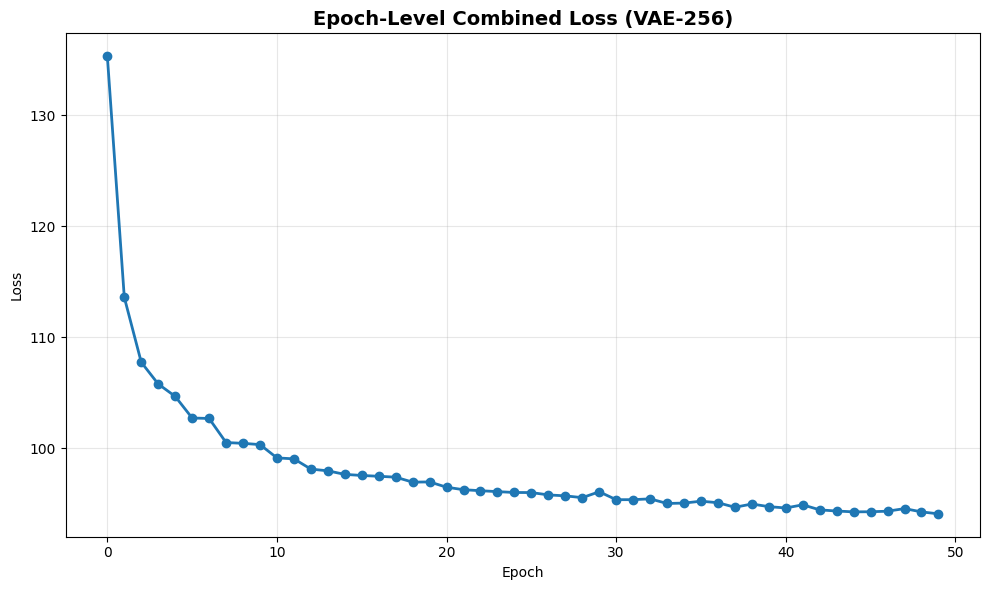

In [14]:
# Plot training losses for VAE-256 using the plot_training_loss function

# Plot combined loss
plot_training_loss(log_dict_256['train_combined_loss_per_batch'], NUM_EPOCHS, 
                   averaging_iterations=100, custom_label=' (Combined)')
plt.suptitle('Combined Loss (VAE-256)', fontsize=14, fontweight='bold', y=1.02)
plt.show()

# Plot reconstruction loss
plot_training_loss(log_dict_256['train_reconstruction_loss_per_batch'], NUM_EPOCHS, 
                   averaging_iterations=100, custom_label=' (Reconstruction)')
plt.suptitle('Reconstruction Loss (BCE) (VAE-256)', fontsize=14, fontweight='bold', y=1.02)
plt.show()

# Plot KL divergence loss
plot_training_loss(log_dict_256['train_kl_loss_per_batch'], NUM_EPOCHS, 
                   averaging_iterations=100, custom_label=' (KL Divergence)')
plt.suptitle('KL Divergence Loss (VAE-256)', fontsize=14, fontweight='bold', y=1.02)
plt.show()

# Also plot epoch-level combined loss
if log_dict_256['train_combined_loss_per_epoch']:
    plt.figure(figsize=(10, 6))
    plt.plot(log_dict_256['train_combined_loss_per_epoch'], marker='o', linewidth=2)
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Epoch-Level Combined Loss (VAE-256)', fontsize=14, fontweight='bold')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

### Reconstruction Quality - VAE-256

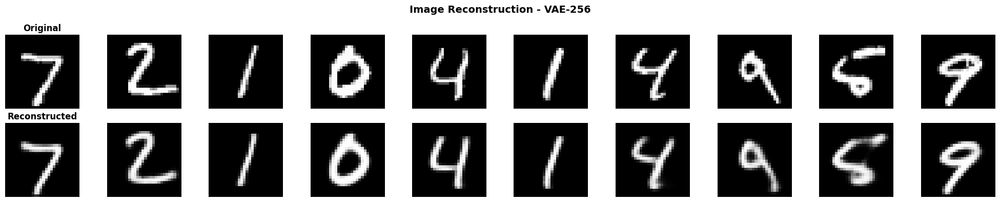

In [15]:
# Visualize reconstructions for VAE-256
vae_256.eval()

# Reconstruct images
with torch.no_grad():
    encoded_256, mu_256, logvar_256, recon_images_256 = vae_256(test_images.to(device))

# Move to CPU for visualization
recon_images_256 = recon_images_256.cpu()

# Plot original and reconstructed images
n_images = 10
fig, axes = plt.subplots(2, n_images, figsize=(20, 4))

for i in range(n_images):
    # Original images
    axes[0, i].imshow(test_images[i].squeeze(), cmap='gray')
    axes[0, i].axis('off')
    if i == 0:
        axes[0, i].set_title('Original', fontsize=12, fontweight='bold')
    
    # Reconstructed images
    axes[1, i].imshow(recon_images_256[i].squeeze(), cmap='gray')
    axes[1, i].axis('off')
    if i == 0:
        axes[1, i].set_title('Reconstructed', fontsize=12, fontweight='bold')

plt.suptitle('Image Reconstruction - VAE-256', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

### Generated Images - VAE-256

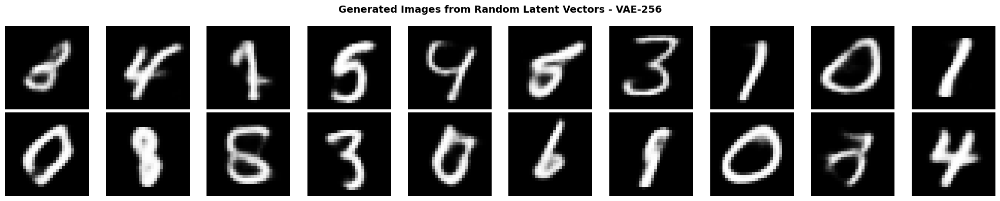

In [16]:
# Generate new images with VAE-256
vae_256.eval()

n_samples = 20
with torch.no_grad():
    # Sample random latent vectors
    z = torch.randn(n_samples, vae_256.latent_dim).to(device)
    
    # Decode to generate images
    generated_images_256 = vae_256.decode(z).cpu()

# Plot generated images
fig, axes = plt.subplots(2, 10, figsize=(20, 4))
for i in range(n_samples):
    row = i // 10
    col = i % 10
    axes[row, col].imshow(generated_images_256[i].squeeze(), cmap='gray')
    axes[row, col].axis('off')

plt.suptitle('Generated Images from Random Latent Vectors - VAE-256', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## Comparison

### Side-by-Side Reconstruction Comparison

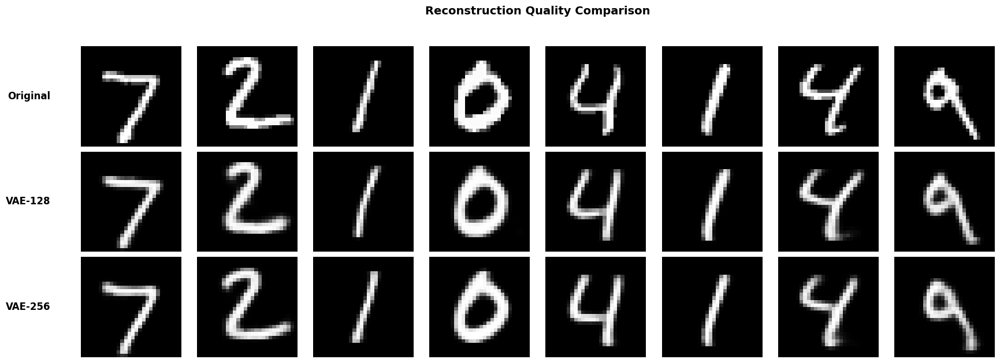

In [18]:
# Compare reconstructions side by side
n_images = 8
fig, axes = plt.subplots(3, n_images, figsize=(20, 7))

row_labels = ['Original', 'VAE-128', 'VAE-256']

for r in range(3):
    for c in range(n_images):
        if r == 0:
            axes[r, c].imshow(test_images[c].squeeze(), cmap='gray')
        elif r == 1:
            axes[r, c].imshow(recon_images[c].squeeze(), cmap='gray')
        else:
            axes[r, c].imshow(recon_images_256[c].squeeze(), cmap='gray')
        axes[r, c].axis('off')
        
        # Only add label to first column
        if c == 0:
            axes[r, c].text(-0.3, 0.5, row_labels[r], transform=axes[r, c].transAxes,
                             fontsize=12, fontweight='bold', va='center', ha='right')

plt.suptitle('Reconstruction Quality Comparison', fontsize=14, fontweight='bold')
plt.subplots_adjust(wspace=0.05, hspace=0.05, left=0.1)
plt.show()

### Side-by-Side Generated Images Comparison

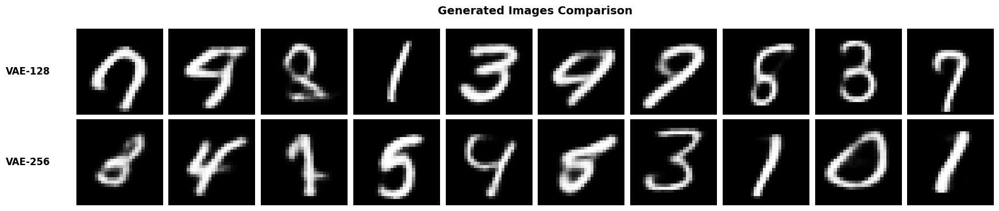

In [19]:
# Compare generated images side by side
n_images = 10
fig, axes = plt.subplots(2, n_images, figsize=(20, 4))

row_labels = ['VAE-128', 'VAE-256']

for r in range(2):
    for c in range(n_images):
        if r == 0:
            axes[r, c].imshow(generated_images[c].squeeze(), cmap='gray')
        else:
            axes[r, c].imshow(generated_images_256[c].squeeze(), cmap='gray')
        axes[r, c].axis('off')
        
        # Add label only to the first column
        if c == 0:
            axes[r, c].text(-0.3, 0.5, row_labels[r], transform=axes[r, c].transAxes,
                             fontsize=12, fontweight='bold', va='center', ha='right')

plt.suptitle('Generated Images Comparison', fontsize=14, fontweight='bold')
plt.subplots_adjust(wspace=0.05, hspace=0.05, left=0.1)
plt.show()